## 1. Defining the Question

> ### a) Specifying the Question

* As a Data Scientist, you work for Hass Consulting Company which is a real estate leader with over 25 years of experience. 

* You have been tasked to study the factors that affect housing prices using the given information on real estate properties that was collected over the past few months. 

* Later onwards, create a model that would allow the company to accurately predict the sale of prices upon being provided with the predictor variables. 

> ### b) Defining the Metric for Success

> Multilinear Regression

> Quantile Regression

> Ridge Regression

> Elastic Net Regression

> ### c) Understanding the context 

> This project is in the context of the real estate industry. 


> ### d) Recording the Experimental Design

> ### e) Data Relevance

## 2. Reading the Data

In [0]:
# Import the necessary libraries
#
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet, Ridge
from sklearn.preprocessing import StandardScaler
import statsmodels.formula.api as smf

%matplotlib inline
sns.set(style="ticks", color_codes=True)

sns.set(rc={'axes.facecolor':'#8cd98c', 'figure.facecolor':'#b3b3cc'})


**Loading the dataset**

In [2]:
# Loading our dataset
#
estate_df = pd.read_csv("Independent Project Week 7 - house_data.csv")
estate_df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
# Check the data info
#
estate_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   price          21613 non-null  float64
 2   bedrooms       21613 non-null  int64  
 3   bathrooms      21613 non-null  float64
 4   sqft_living    21613 non-null  int64  
 5   sqft_lot       21613 non-null  int64  
 6   floors         21613 non-null  float64
 7   waterfront     21613 non-null  int64  
 8   view           21613 non-null  int64  
 9   condition      21613 non-null  int64  
 10  grade          21613 non-null  int64  
 11  sqft_above     21613 non-null  int64  
 12  sqft_basement  21613 non-null  int64  
 13  yr_built       21613 non-null  int64  
 14  yr_renovated   21613 non-null  int64  
 15  zipcode        21613 non-null  int64  
 16  lat            21613 non-null  float64
 17  long           21613 non-null  float64
 18  sqft_l

In [4]:
# Get the data description
#
estate_df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.401822e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.673622e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [5]:
# Determining the no. of records in our dataset
#
estate_df.shape

(21613, 20)

In [6]:
# Checking our column names
#
estate_df.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

### External Data Source Validation

Making sure your data matches something outside of the dataset is very important. It allows you to ensure that the measurements are roughly in line with what they should be and it serves as a check on what other things might be wrong in your dataset. 
External validation can often be as simple as checking your data against a single number, as we will do here.

### Data cleaning

In [7]:
# Check for null values
#
estate_df.isnull().sum()

id               0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [8]:
# Check for duplicate values
#
estate_df.duplicated().sum()

3

In [0]:
# Drop duplicated values
#
estate_df.drop_duplicates(inplace=True)

In [10]:
# Confirm that the duplicate values have been dropped
#
estate_df.duplicated().any()

False

**Checking for outliers**

 Ourtliers:
 [[1230000.0, 2000000.0, 1350000.0, 1330000.0, 1450000.0, 2250000.0, 1510000.0, 2400000.0, 2900000.0, 1370000.0, 2050000.0, 3080000.0, 2380000.0, 1380000.0, 1400000.0, 1350000.0, 1550000.0, 1300000.0, 1450000.0, 1200000.0, 1150000.0, 1390000.0, 1280000.0, 1200000.0, 1490000.0, 2250000.0, 1600000.0, 2130000.0, 1450000.0, 1950000.0, 1220000.0, 3070000.0, 1250000.0, 1150000.0, 1480000.0, 1580000.0, 1300000.0, 1310000.0, 2250000.0, 1360000.0, 1220000.0, 2400000.0, 1270000.0, 1200000.0, 1320000.0, 2450000.0, 1240000.0, 1570000.0, 1200000.0, 1280000.0, 1960000.0, 1750000.0, 5110000.0, 1150000.0, 1880000.0, 1230000.0, 2300000.0, 2260000.0, 5300000.0, 1200000.0, 2200000.0, 1180000.0, 1700000.0, 1400000.0, 2540000.0, 1360000.0, 1230000.0, 5350000.0, 1330000.0, 1220000.0, 1250000.0, 1300000.0, 1180000.0, 1380000.0, 1150000.0, 1200000.0, 2250000.0, 1230000.0, 1270000.0, 1680000.0, 1930000.0, 1180000.0, 2350000.0, 1140000.0, 1320000.0, 1430000.0, 1530000.0, 1570000.0, 1580000.0, 125000

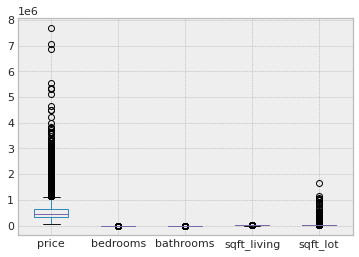

In [11]:
plt.style.use('bmh')

# Define the numeric columns
#
numeric = estate_df.iloc[:, 1:]

# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, :5], return_type='both')

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]

print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[], [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0], [3.0, 4.0, 2.0, 4.0, 3.0, 2.0, 2.0, 3.0, 2.0, 2.0, 3.0, 2.0, 2.0, 3.0, 3.0, 4.0, 2.0, 2.0, 4.0, 2.0, 4.0, 2.0, 1.0, 2.0, 3.0, 2.0, 4.0, 2.0, 4.0, 3.0, 3.0, 2.0, 2.0,

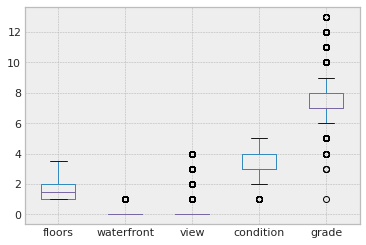

In [12]:
plt.style.use('bmh')

# Define the numeric columns
#
numeric = estate_df.iloc[:, 1:]

# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 5:10], return_type='both')

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]

print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[3890, 3760, 4750, 5310, 3840, 6070, 4040, 3840, 4860, 3860, 4030, 4410, 6050, 4740, 5403, 4120, 4150, 4370, 4570, 4670, 4230, 4270, 5670, 4475, 6070, 4300, 3990, 5990, 4460, 4190, 4250, 4930, 3840, 5000, 5320, 6720, 4210, 3890, 3830, 5153, 4210, 4740, 5450, 4280, 3880, 4570, 3750, 4130, 5710, 4700, 3810, 4490, 4150, 4070, 3840, 5770, 4030, 3810, 4490, 3840, 4360, 3960, 4460, 4340, 3850, 4750, 4350, 4160, 5180, 4070, 5130, 6350, 3770, 3780, 4750, 3950, 3915, 3880, 4870, 4030, 4740, 3850, 4860, 4310, 3930, 4070, 4080, 5400, 6110, 3859, 4600, 3940, 3800, 4230, 4070, 5050, 4000, 4220, 3860, 3890, 3890, 5230, 5370, 4140, 4270, 4430, 4210, 4130, 3780, 4610, 7680, 4250, 3820, 4120, 3770, 4610, 5080, 4140, 4340, 3770, 5760, 4390, 4000, 3810, 4400, 6200, 4320, 4380, 4040, 4580, 4180, 4240, 4070, 6110, 4115, 3780, 3830, 3780, 5830, 4140, 3920, 3930, 5990, 5070, 3910, 3810, 4020, 3830, 3880, 3810, 4130, 4750, 4060, 4060, 4890, 3820, 4160, 4020, 4090, 3990, 4560, 4570, 3760, 4060, 4

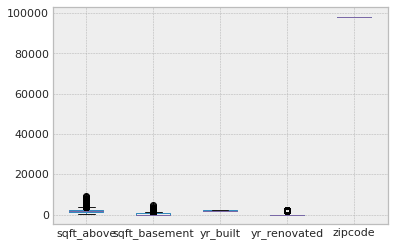

In [13]:
plt.style.use('bmh')

# Define the numeric columns
#
numeric = estate_df.iloc[:, 1:]

# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 10:15], return_type='both')

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]

print(f" Ourtliers:\n {out_list}")

 Ourtliers:
 [[47.1559, 47.1593], [-121.714, -121.711, -121.772, -121.709, -121.779, -121.755, -121.77600000000001, -121.771, -121.758, -121.785, -121.759, -121.787, -121.772, -121.78200000000001, -121.75200000000001, -121.78, -121.708, -121.721, -121.77799999999999, -121.76899999999999, -121.75399999999999, -121.771, -121.771, -121.74600000000001, -121.359, -121.789, -121.70700000000001, -121.79899999999999, -121.774, -121.72399999999999, -121.756, -121.809, -121.691, -121.315, -121.744, -121.70700000000001, -121.772, -121.745, -121.744, -121.646, -121.76299999999999, -121.71799999999999, -121.75200000000001, -121.777, -121.755, -121.76299999999999, -121.787, -121.779, -121.759, -121.756, -121.772, -121.735, -121.801, -121.76100000000001, -121.723, -121.756, -121.744, -121.764, -121.315, -121.745, -121.76799999999999, -121.738, -121.764, -121.82, -121.76899999999999, -121.756, -121.74600000000001, -121.417, -121.76799999999999, -121.77, -121.77, -121.743, -121.749, -121.744, -121.473,

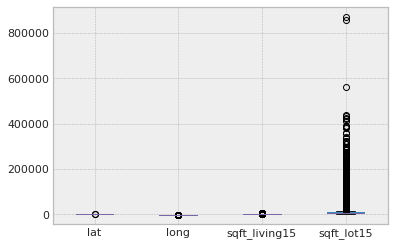

In [14]:
plt.style.use('bmh')

# Define the numeric columns
#
numeric = estate_df.iloc[:, 1:]

# plotting outliers for the numeric columns
#
_t, cols = pd.DataFrame.boxplot(numeric.iloc[:, 15:], return_type='both')

outliers = [flier.get_ydata() for flier in cols['fliers']]
out_list = [i.tolist() for i in outliers]

print(f" Ourtliers:\n {out_list}")

**Removing Outliers**

In [15]:

# Getting ouliers from our dataframe using a z-test
#
from scipy import stats
z = np.abs(stats.zscore(numeric))
print(f" z-score list: {z}\n")

df_o = numeric[(z < 3).all(axis=1)]

print(f"Previous dataframe size : {numeric.shape[0]}")
print(f"New dataframe size: {df_o.shape[0]}")

 z-score list: [[0.8663502  0.39872223 1.447363   ... 0.30597436 0.94325844 0.2607194 ]
 [0.00593105 0.39872223 0.17562183 ... 0.74622283 0.43261512 0.18787651]
 [0.98040133 1.4738891  1.447363   ... 0.1355556  1.07013523 0.17238503]
 ...
 [0.37584596 1.4738891  1.77195996 ... 0.60420719 1.41013234 0.39413652]
 [0.38156485 0.39872223 0.50021879 ... 1.0289726  0.84112978 0.42050499]
 [0.58571365 1.4738891  1.77195996 ... 0.60420719 1.41013234 0.41794139]]

Previous dataframe size : 21610
New dataframe size: 18700


In [16]:
# Checking for null values
#
estate_df.isnull().any()

id               False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront       False
view             False
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated     False
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

In [0]:
# Dropping null values
#
estate_df.dropna(inplace=True)

In [18]:
# confirming the null values have been dropped
#
estate_df.isnull().any()

id               False
price            False
bedrooms         False
bathrooms        False
sqft_living      False
sqft_lot         False
floors           False
waterfront       False
view             False
condition        False
grade            False
sqft_above       False
sqft_basement    False
yr_built         False
yr_renovated     False
zipcode          False
lat              False
long             False
sqft_living15    False
sqft_lot15       False
dtype: bool

In [0]:
# Exporting our clean dataframe
#
estate_df.to_csv('clean_estate_df.csv')

### *Loading our clean dataset*

In [20]:
estate = pd.read_csv("clean_estate_df.csv")
estate.head()

,Unnamed: 0,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


Exploratory Analysis

> ***Univariate Analysis***

In [21]:
numeric = estate.iloc[:, 3:].columns
numeric

Index(['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15'],
      dtype='object')

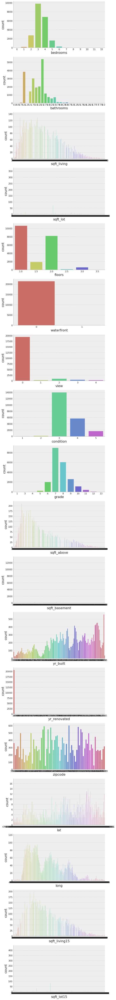

In [22]:
# Plot countplot frequencies of the numeric data
#

fig, ax = plt.subplots(len(numeric), figsize=(8,88))

for i,colval in enumerate(numeric):
  sns.countplot(estate[colval], ax=ax[i], palette='hls')
  ax[i].set_xlabel(colval, fontsize=16)
  ax[i].set_ylabel("count", fontsize=16)
  sns.despine()

plt.show()

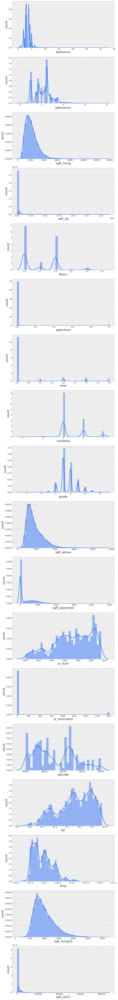

In [23]:
# Plot frequency distributions of the numeric data
#

fig, ax = plt.subplots(len(numeric), figsize=(10,100))


for i,colval in enumerate(numeric):
  sns.distplot(estate[colval], hist=True, ax=ax[i], color='#0055ff')
  ax[i].set_xlabel(colval, fontsize=16)
  ax[i].set_ylabel("count", fontsize=16)

plt.show()

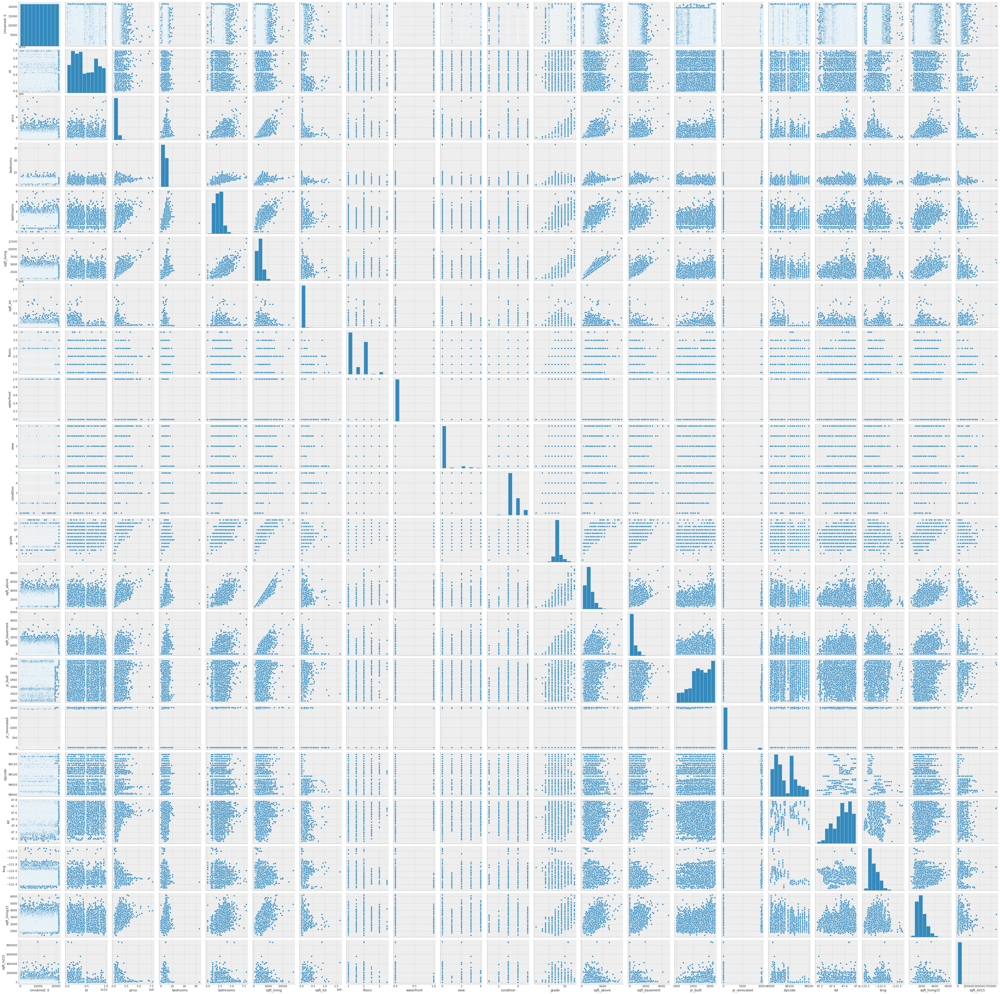

In [24]:
# Plotting a pairplot of the data
#
fig = figsize=(48,100)
sns.pairplot(estate)

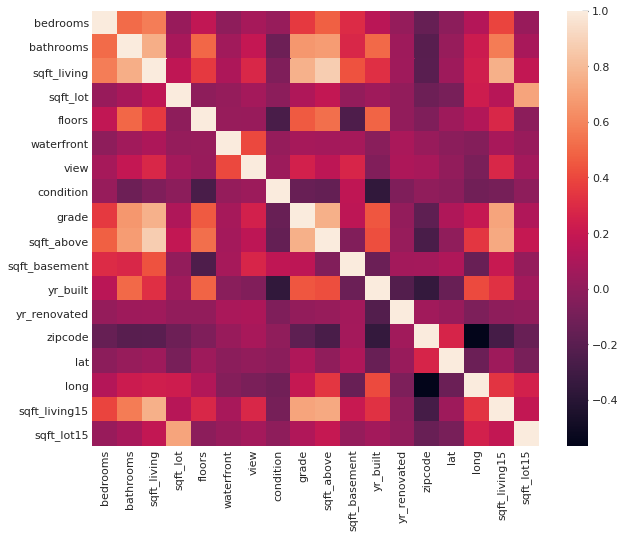

In [25]:
# Correlation matrix
#
f, ax = plt.subplots(figsize=(10,8))
corr = estate.iloc[:, 3:].corr()
sns.heatmap(corr,\
            xticklabels = corr.columns.values,\
            yticklabels = corr.columns.values)

**Multivariate Analysis**

>##### ***Linear Discriminant Analysis***

In [0]:
X = estate.iloc[:, 3:].values
y = estate['price'].values

## Implementing the Solution

#### 1) **MultiLinear regression**

In [0]:
# We will use the python package statsmodels for Quantile Regression
# and Linear regression
#
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression

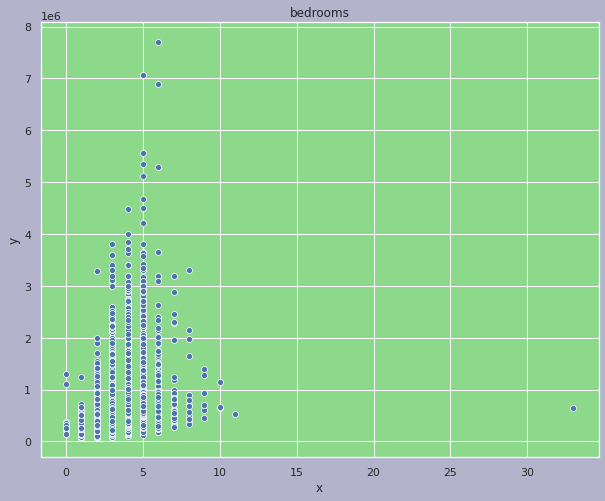

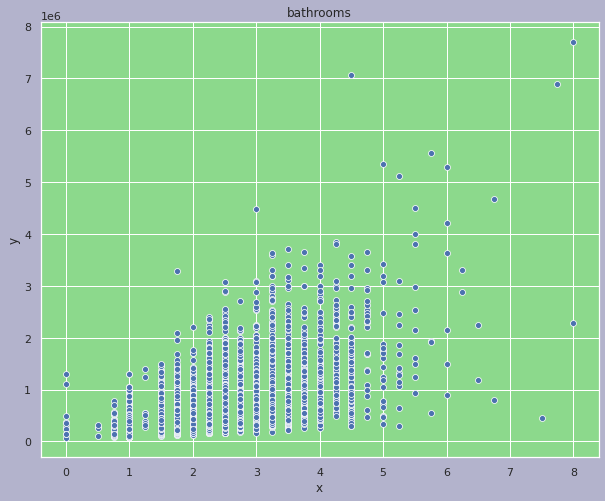

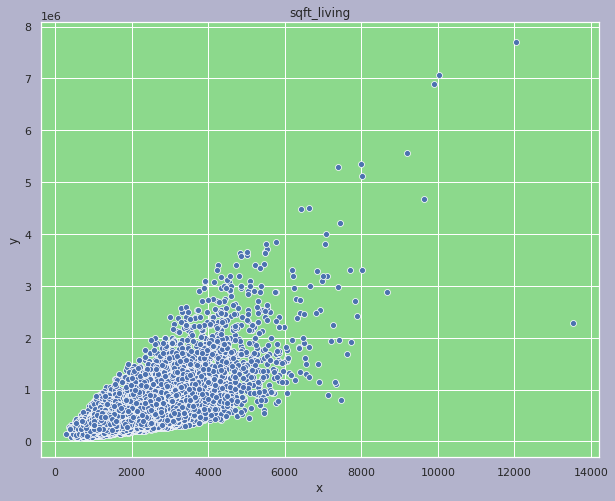

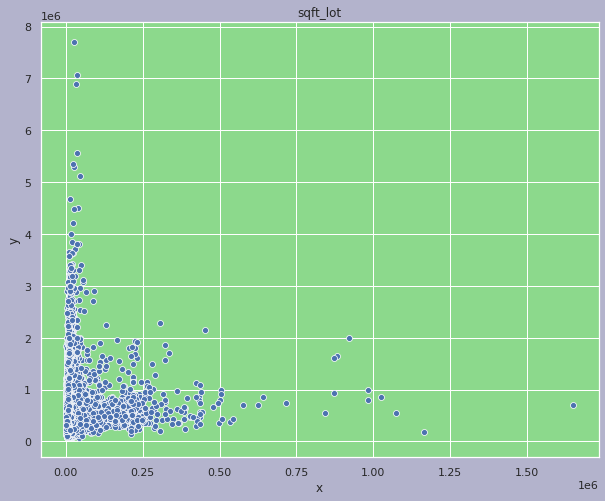

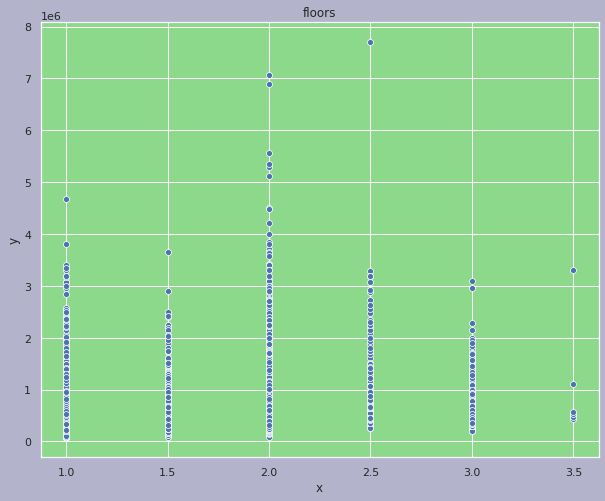

...

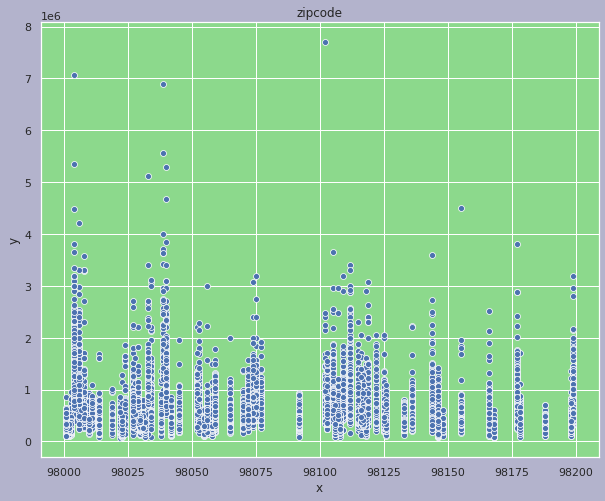

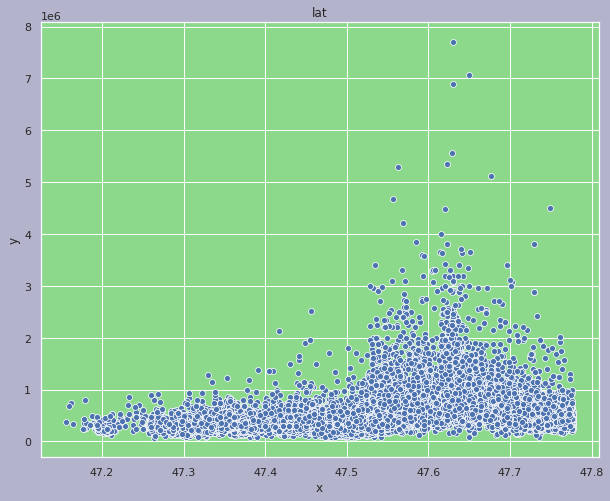

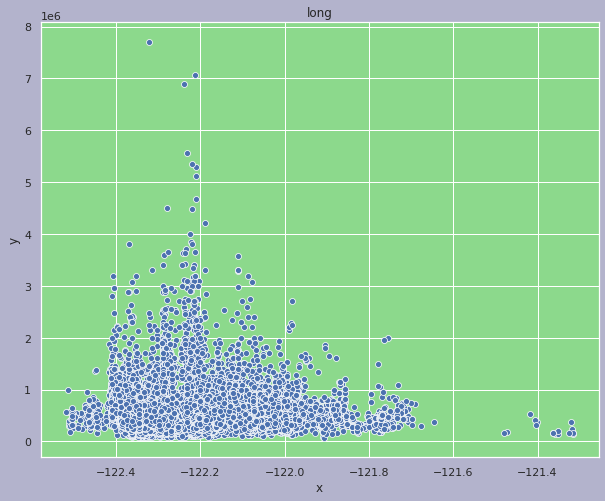

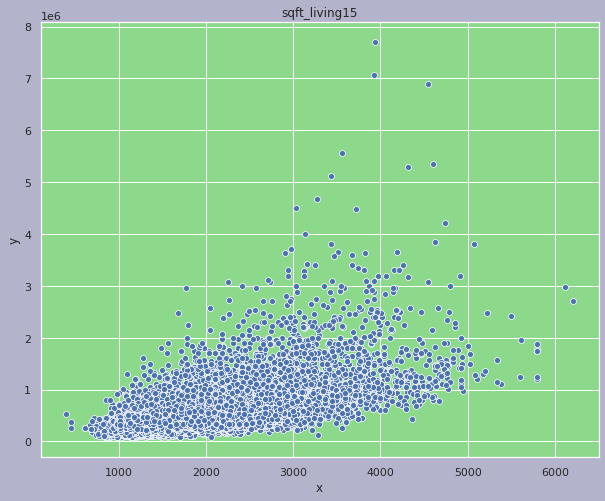

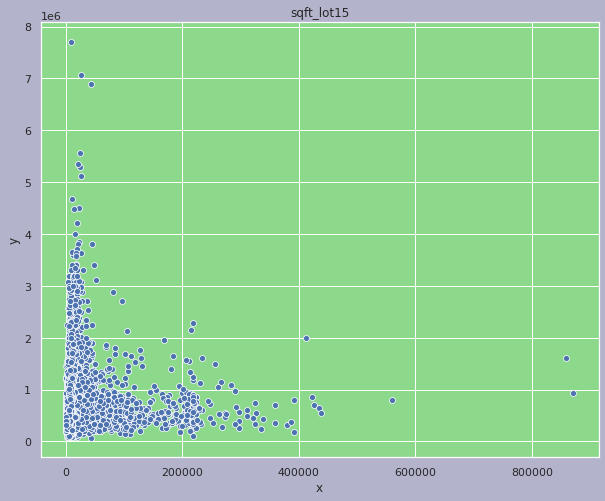

In [42]:
# Plot Scatter plots for the numerical variables
#
for i, colval in enumerate(numeric):
  x = np.array(estate_df[colval])
  y = np.array(estate_df['price'])

  figure,ax = plt.subplots(figsize=(10,8))
  sns.scatterplot(x,y, palette='hls')
  plt.xlabel("x")
  plt.ylabel("y")
  plt.title(f"{colval}")

                                | bedrooms |

Mean squared error: 122135047322.99
Variance score: 0.10


     -------------------    

                                | bathrooms |

Mean squared error: 97747173555.18
Variance score: 0.28


     -------------------    

                                | sqft_living |

Mean squared error: 68446228009.70
Variance score: 0.49


     -------------------    

                                | sqft_lot |

Mean squared error: 133882456200.24
Variance score: 0.01


     -------------------    

                                | floors |

Mean squared error: 126067267839.29
Variance score: 0.07


     -------------------    

                                | waterfront |

Mean squared error: 125393820156.43
Variance score: 0.07


     -------------------    

                                | view |

Mean squared error: 113645350269.15
Variance score: 0.16


     -------------------    

                                | condition |

Mean squar

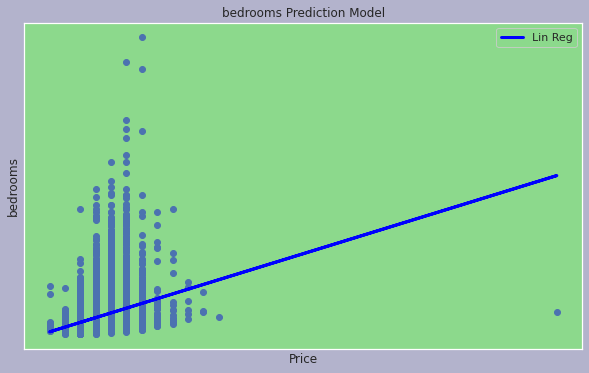

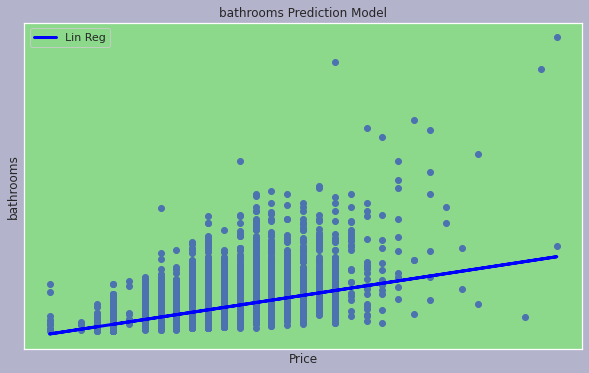

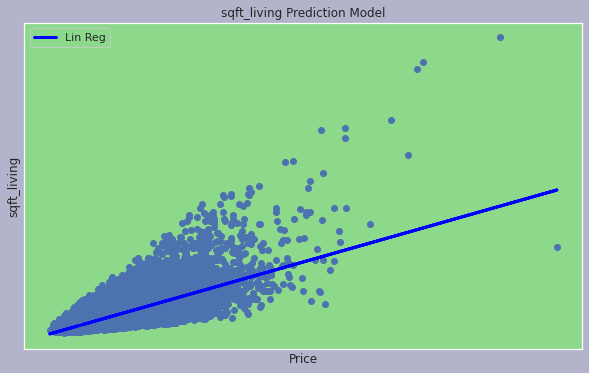

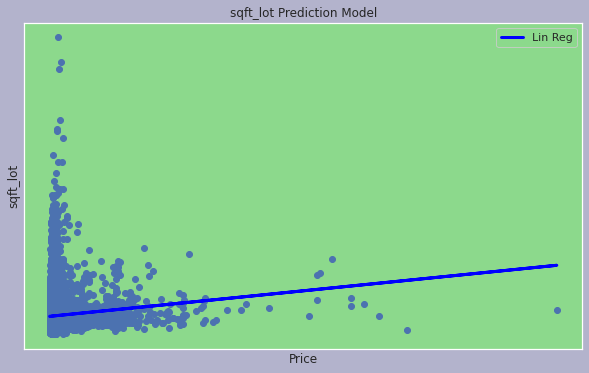

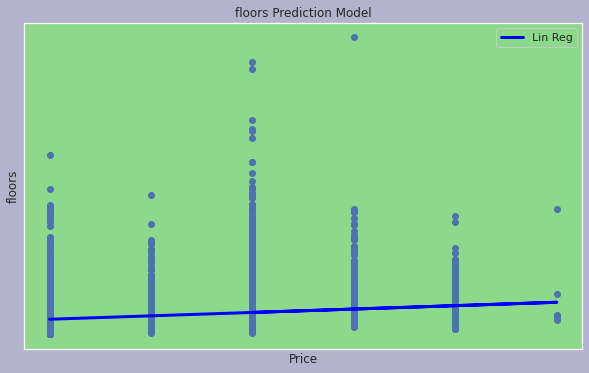

...

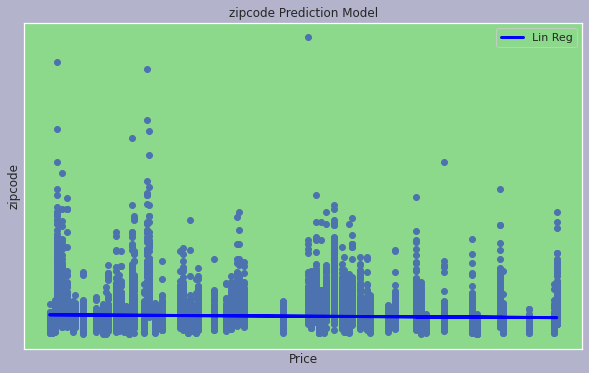

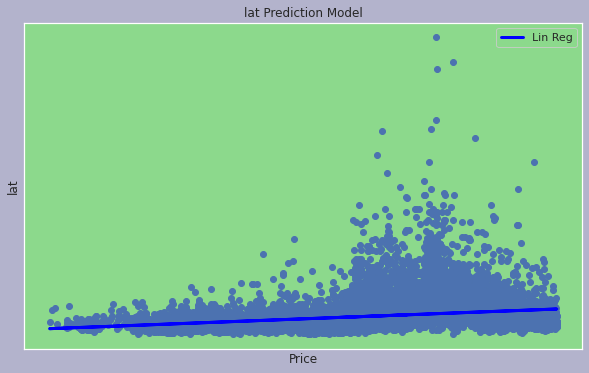

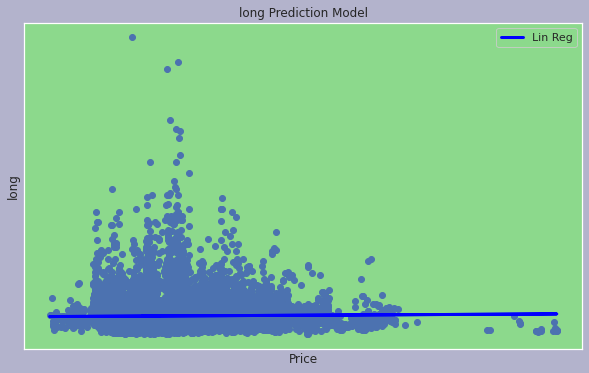

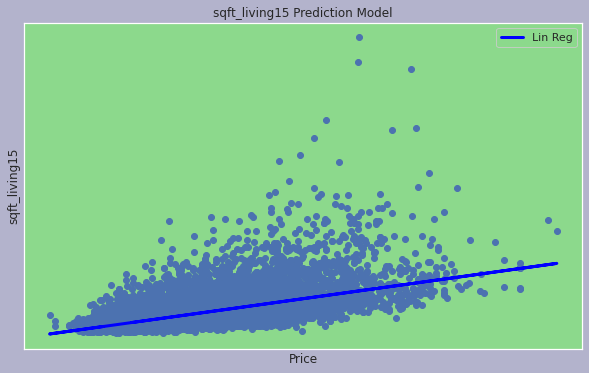

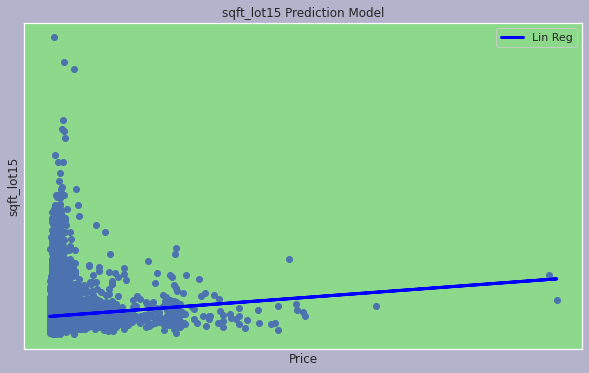

In [43]:
# We Create a for loop to perform the operations of the Linear regression model
# to every single column in our features set
# -----
#
for i, colval in enumerate(numeric):
  x = np.array(estate_df[colval].values.reshape(-1,1))
  y = np.array(estate_df['price'])
  model1 = LinearRegression(fit_intercept=True, normalize=False)
  model1.fit(x,y)

  y_pred1 = model1.predict(x)
  print(f"                                | {colval} |\n")
  print("Mean squared error: {0:.2f}".format(np.mean((y_pred1 - y) ** 2)))
  print('Variance score: {0:.2f}'.format(model1.score(x, y)))
  print("\n")

  print("     -------------------    \n")

  # Use OLS to do Linear Regression Prediction
  linreg = smf.ols('y ~ x', estate_df).fit()
  ci = linreg.conf_int().loc['x'].tolist()

  lin = dict(intercept = linreg.params['Intercept'],
                  disp_coef = linreg.params['x'],
                  ci_lb = ci[0],
                  ci_ub = ci[1])
  fig, ax = plt.subplots(figsize=(10,6))
  plt.scatter(x, y)

  y_pred1 = linreg.params['Intercept'] + linreg.params['x']*x
  plt.plot(x, y_pred1, color='blue',linewidth=3, label='Lin Reg')

  plt.xticks(())
  plt.yticks(())
  plt.title(f"{colval} Prediction Model")
  plt.xlabel("Price")
  plt.ylabel(colval)
  plt.legend()

#### 2) **Quantile regression**

> Since Quantile Regression is reliable in cases where the data suffers from outliers and heteroscedasticity then we are going to use the original dataframe without the outliers removed.

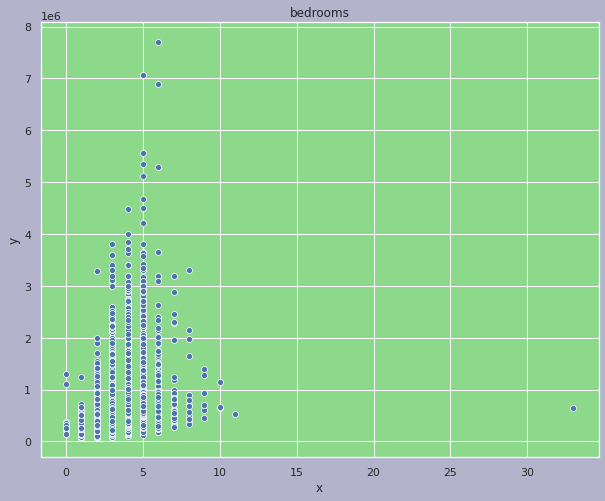

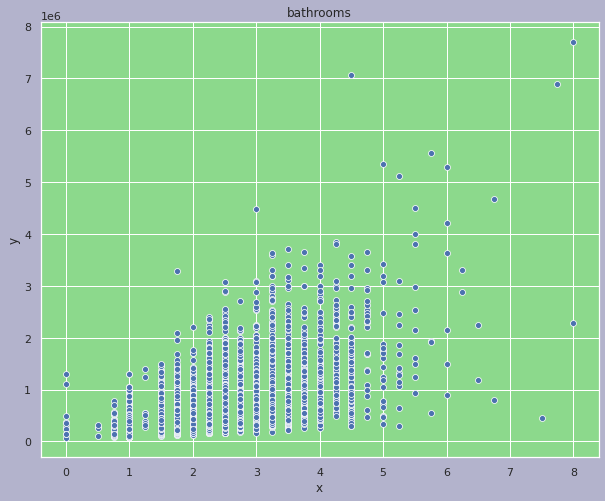

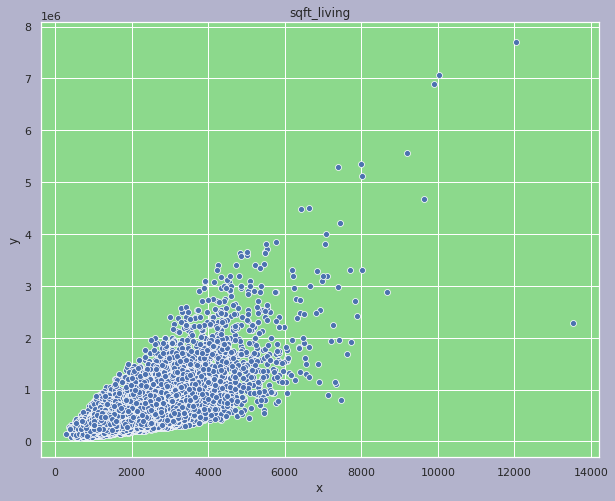

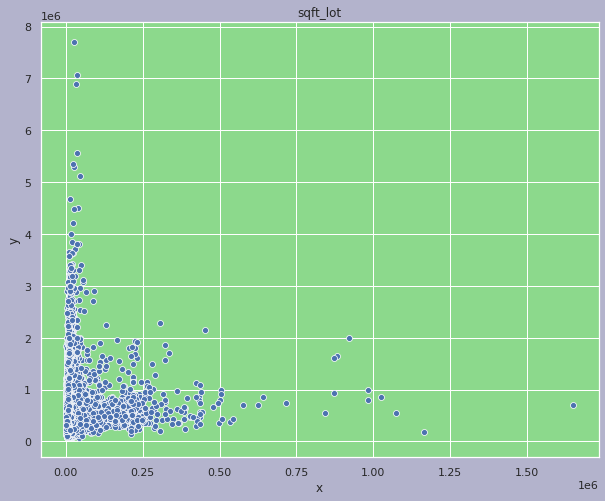

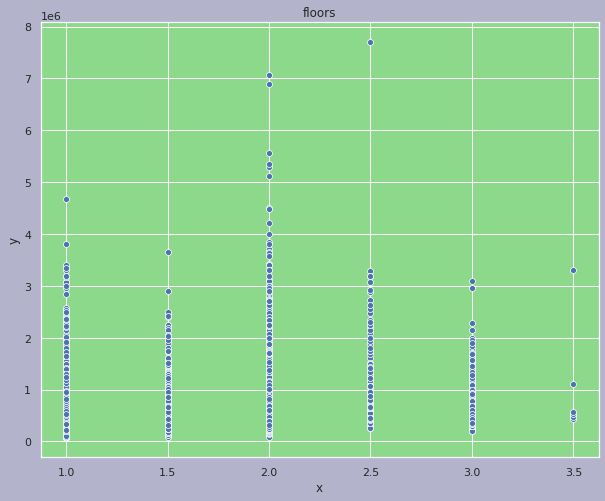

...

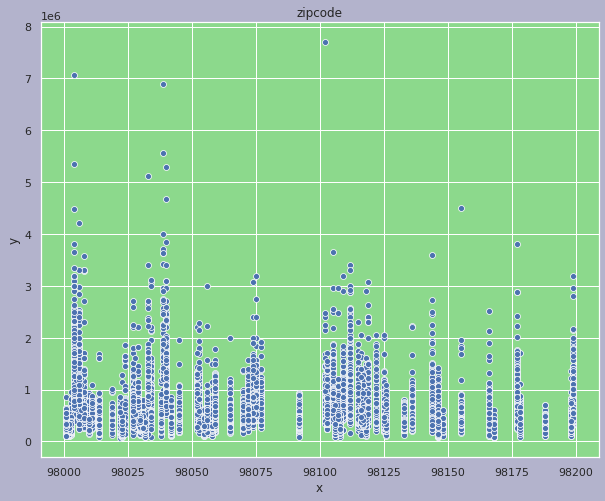

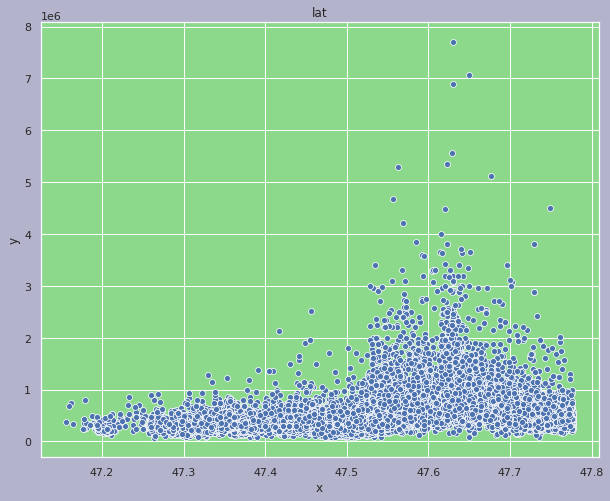

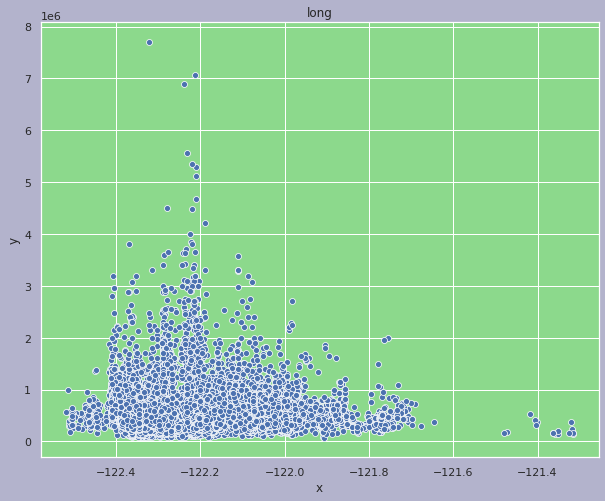

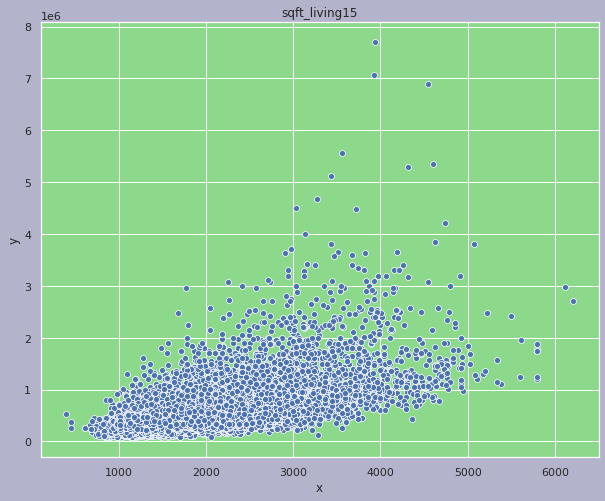

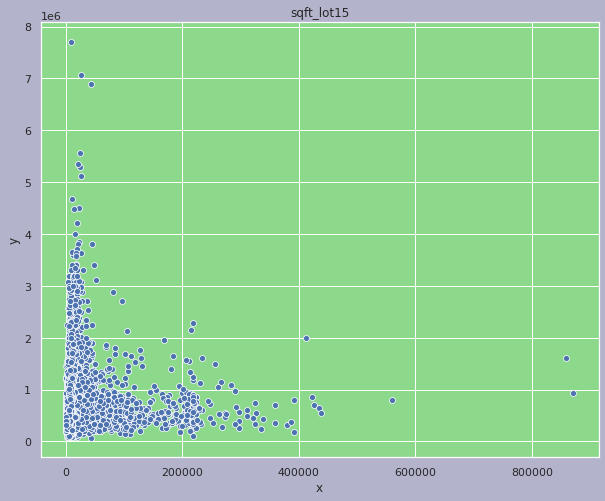

In [44]:
# Plot Scatter plots for the numerical variables
#
for i, colval in enumerate(numeric):
  x = np.array(estate_df[colval])
  y = np.array(estate_df['price'])

  figure,ax = plt.subplots(figsize=(10,8))
  sns.scatterplot(x,y, palette='hls')
  plt.xlabel("x")
  plt.ylabel("y")
  plt.title(f"{colval}")

                                | bedrooms |

Mean squared error: 122135047322.99
Variance score: 0.10


bedrooms                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:              0.04633
Model:                       QuantReg   Bandwidth:                   4.016e+04
Method:                 Least Squares   Sparsity:                    5.565e+05
Date:                Sat, 06 Jun 2020   No. Observations:                21610
Time:                        18:42:47   Df Residuals:                    21608
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     1.8e+05   7116.396     25.294      0.000    1.66e+05    1.94e+05
x             8.5e+04   2035.111     41.767      0.000     8.1e+04     8.9e+04

~~~~~~~~~~~~~~~~

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:187: ConvergenceWarning: Convergence cycle detected
  warnings.warn("Convergence cycle detected", ConvergenceWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt     intercept      X_coef  cf_lower_bound  cf_upper_bound
0  0.25  30432.624116  165.248227      162.939971      167.556483
1  0.50  52696.035240  216.740088      213.230524      220.249652
2  0.75  87978.720799  265.957447      261.157352      270.757543 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | sqft_lot |

Mean squared error: 133882456200.24
Variance score: 0.01




/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


sqft_lot                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:             0.005469
Model:                       QuantReg   Bandwidth:                   4.179e+04
Method:                 Least Squares   Sparsity:                    5.546e+05
Date:                Sat, 06 Jun 2020   No. Observations:                21610
Time:                        18:42:52   Df Residuals:                    21608
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.371e+05   2007.906    217.686      0.000    4.33e+05    4.41e+05
x              0.7234      0.046     15.884      0.000       0.634       0.813

The condition number is large, 4.69e+04. This might indicate that there are
strong multicollinearity or other numerical p

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt      intercept    X_coef  cf_lower_bound  cf_upper_bound
0  0.25  315333.335735  0.532540        0.453061        0.612019
1  0.50  437092.911431  0.723368        0.634108        0.812629
2  0.75  448282.355084  1.532957        1.458666        1.607248 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | floors |

Mean squared error: 126067267839.29
Variance score: 0.07


floors                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:              0.03511
Model:                       QuantReg   Bandwidth:                   4.070e+04
Method:                 Least Squares   Sparsity:                    5.769e+05
Date:                Sat, 06 Jun 2020   No. Observations:                

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:187: ConvergenceWarning: Convergence cycle detected
  warnings.warn("Convergence cycle detected", ConvergenceWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt      intercept        X_coef  cf_lower_bound  cf_upper_bound
0  0.25  324999.999994   -999.999998    -5358.903356     3358.903360
1  0.50  392500.000000  17500.000000    11591.739423    23408.260577
2  0.75  541430.342773  29523.218689    20098.317465    38948.119913 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | grade |

Mean squared error: 74835710438.77
Variance score: 0.45


grade                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:               0.2526
Model:                       QuantReg   Bandwidth:                   3.075e+04
Method:                 Least Squares   Sparsity:                    4.226e+05
Date:                Sat, 06 Jun 2020   No. Observations:   

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


sqft_basement                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:              0.04318
Model:                       QuantReg   Bandwidth:                   3.946e+04
Method:                 Least Squares   Sparsity:                    5.417e+05
Date:                Sat, 06 Jun 2020   No. Observations:                21610
Time:                        18:43:02   Df Residuals:                    21608
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.015e+05   2206.305    181.959      0.000    3.97e+05    4.06e+05
x            185.2223      4.163     44.492      0.000     177.062     193.382



/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt      intercept      X_coef  cf_lower_bound  cf_upper_bound
0  0.25  295000.000000  132.456150      126.202009      138.710292
1  0.50  401457.758514  185.222252      177.062407      193.382098
2  0.75  569999.999997  246.794872      232.731380      260.858363 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | yr_built |

Mean squared error: 134574113849.99
Variance score: 0.00


yr_built                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:            0.0005198
Model:                       QuantReg   Bandwidth:                   4.219e+04
Method:                 Least Squares   Sparsity:                    5.694e+05
Date:                Sat, 06 Jun 2020   No. Observations:    

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt     intercept      X_coef  cf_lower_bound  cf_upper_bound
0  0.25 -1.016675e+06  677.499997      592.232601      762.767392
1  0.50 -8.135135e+04  270.270270      141.028115      399.512425
2  0.75 -2.522727e+05  454.545431      219.511779      689.579084 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | yr_renovated |

Mean squared error: 132807491068.86
Variance score: 0.02


yr_renovated                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:             0.005126
Model:                       QuantReg   Bandwidth:                   4.181e+04
Method:                 Least Squares   Sparsity:                    5.683e+05
Date:                Sat, 06 Jun 2020   No. Observations:

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


lat                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:               0.1015
Model:                       QuantReg   Bandwidth:                   3.426e+04
Method:                 Least Squares   Sparsity:                    4.361e+05
Date:                Sat, 06 Jun 2020   No. Observations:                21610
Time:                        18:43:11   Df Residuals:                    21608
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -3.278e+07   5.09e+05    -64.388      0.000   -3.38e+07   -3.18e+07
x           6.988e+05   1.07e+04     65.285      0.000    6.78e+05     7.2e+05

The condition number is large, 1.63e+04. This might indicate that there are
strong multicollinearity or other numerical proble

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt     intercept        X_coef  cf_lower_bound  cf_upper_bound
0  0.25 -2.248308e+07  4.800421e+05    4.638391e+05    4.962452e+05
1  0.50 -3.277747e+07  6.987847e+05    6.778049e+05    7.197645e+05
2  0.75 -4.931532e+07  1.050039e+06    1.017900e+06    1.082178e+06 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | long |

Mean squared error: 134904612342.38
Variance score: 0.00




/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


long                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:             0.002001
Model:                       QuantReg   Bandwidth:                   4.195e+04
Method:                 Least Squares   Sparsity:                    5.665e+05
Date:                Sat, 06 Jun 2020   No. Observations:                21610
Time:                        18:43:16   Df Residuals:                    21608
                                        Df Model:                            1
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1.379e+07   1.67e+06      8.246      0.000    1.05e+07    1.71e+07
x           1.091e+05   1.37e+04      7.975      0.000    8.23e+04    1.36e+05

The condition number is large, 1.06e+05. This might indicate that there are
strong multicollinearity or other numerical probl

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt     intercept         X_coef  cf_lower_bound  cf_upper_bound
0  0.25  8.945545e+06   70563.382391    50403.704664    90723.060119
1  0.50  1.378887e+07  109126.985144    82307.302014   135946.668274
2  0.75  1.777569e+07  140187.200211    97577.055858   182797.344563 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             

                                | sqft_living15 |

Mean squared error: 88717793910.03
Variance score: 0.34


sqft_living15                          QuantReg Regression Results                          
Dep. Variable:                      y   Pseudo R-squared:               0.1981
Model:                       QuantReg   Bandwidth:                   3.218e+04
Method:                 Least Squares   Sparsity:                    4.715e+05
Date:                Sat, 06 Jun 2020   No. 

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/quantile_regression.py:192: IterationLimitWarning: Maximum number of iterations (1000) reached.
  ") reached.", IterationLimitWarning)


~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~

     qt      intercept    X_coef  cf_lower_bound  cf_upper_bound
0  0.25  317643.839434  0.711449        0.604845        0.818053
1  0.50  440825.602843  0.870936        0.733319        1.008553
2  0.75  626309.195736  1.339110        1.148784        1.529436 

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

                             -------------------                             



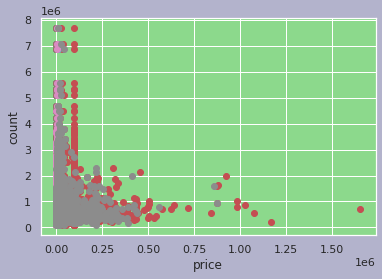

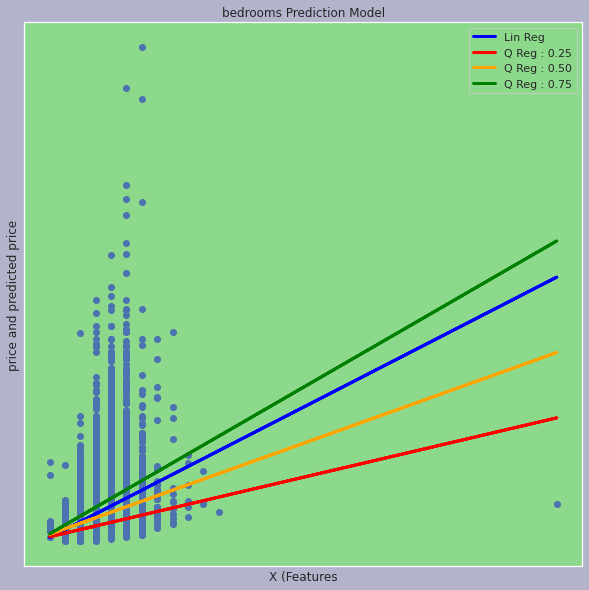

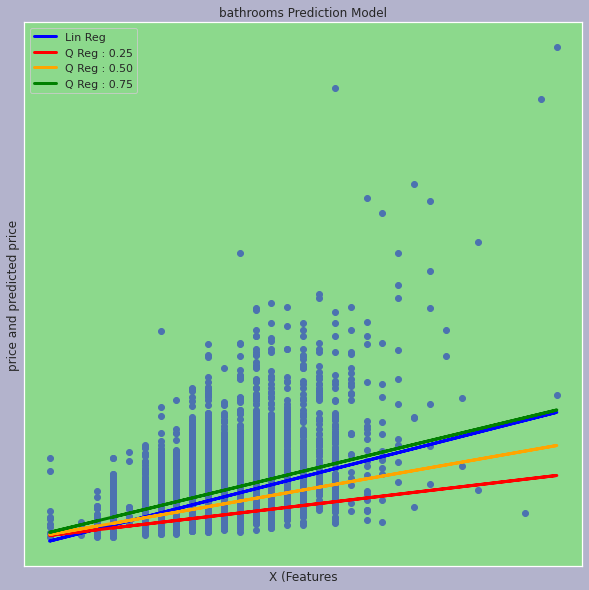

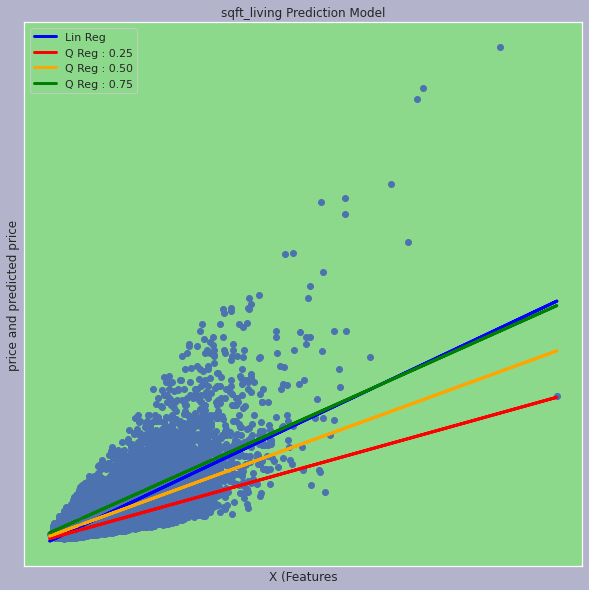

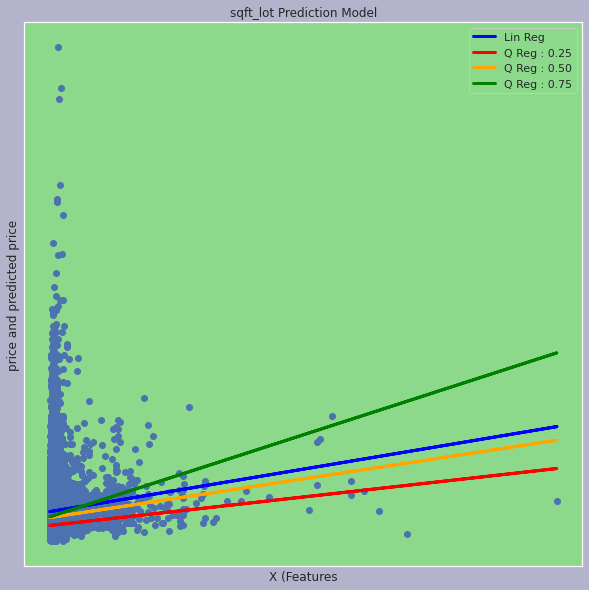

...

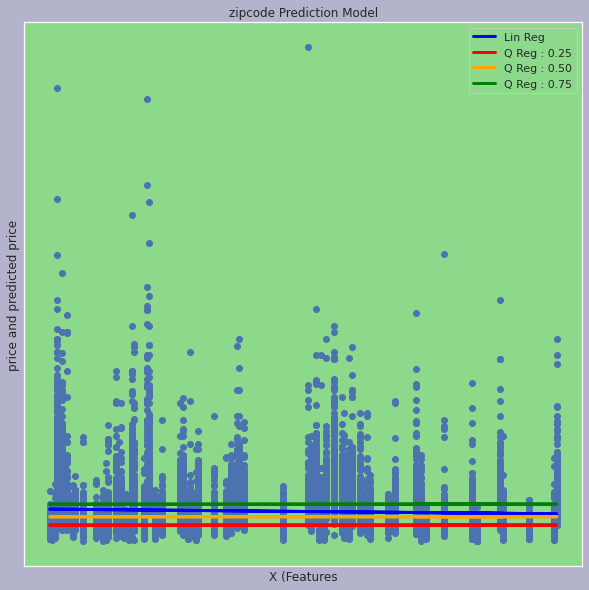

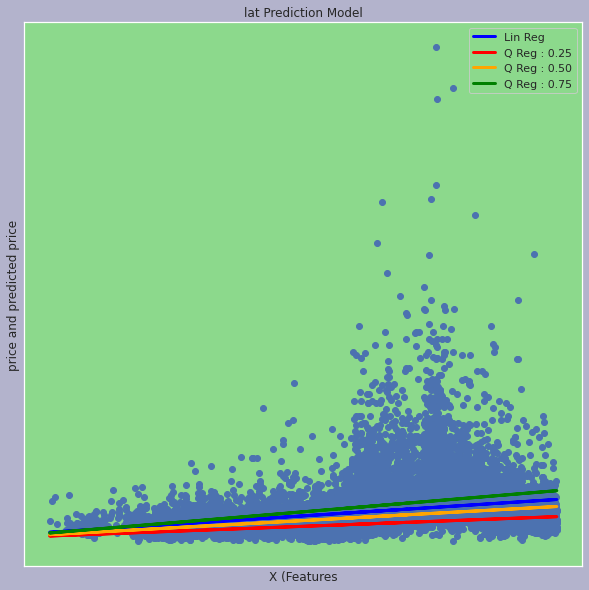

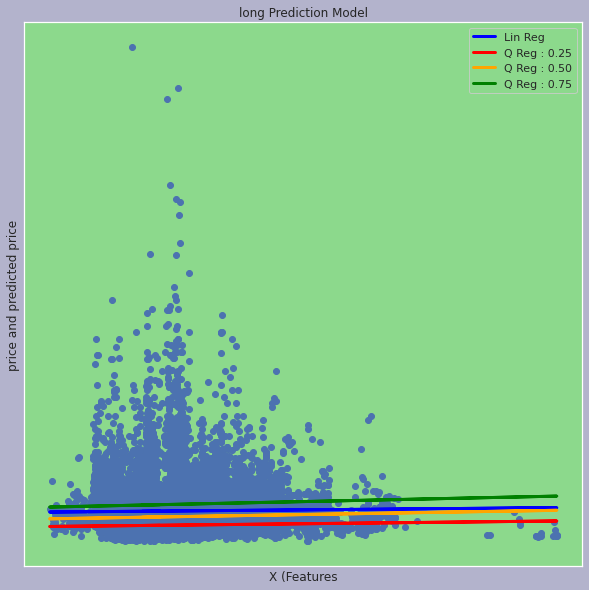

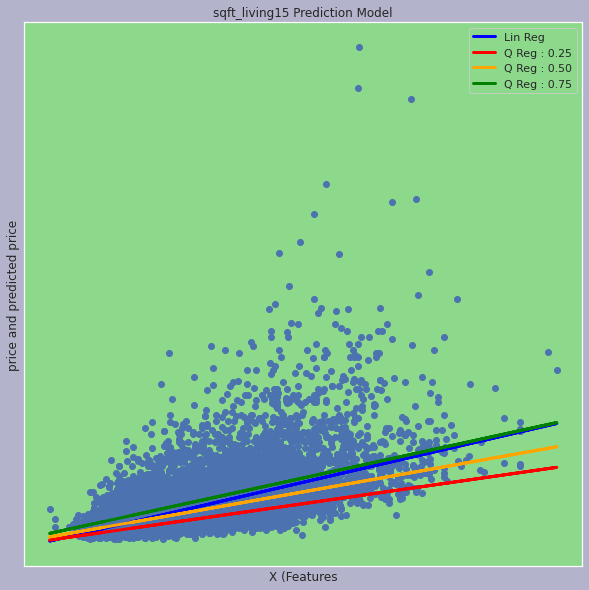

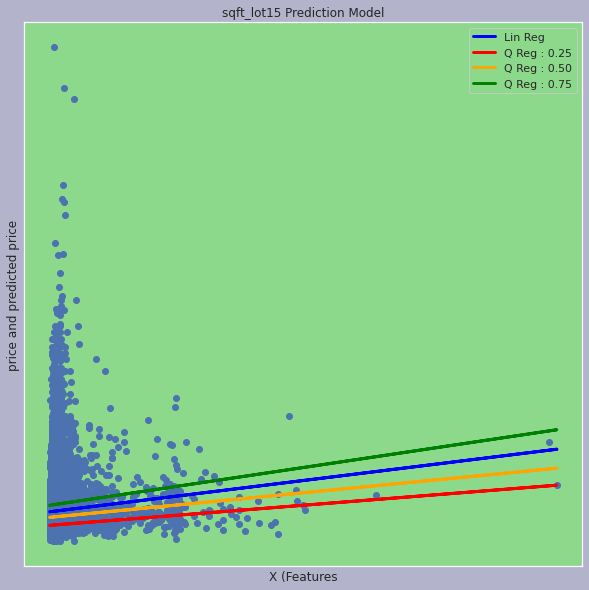

In [46]:
# We Create a for loop to perform the operations of the Quantile regression model
# to every single column in our features set
# -----
#
for i, colval in enumerate(numeric):
  x = np.array(estate_df[colval].values.reshape(-1,1))
  y = np.array(estate_df['price'])

  # mse_calc function performs the quantile regression on the independent variable
  # colval
  # -----
  # We first get the mean squared error and the variance score for each
  # Next we perform a quantile regression
  # We model other quantiles 
  # Then lastly we create a dataframe so that we can view the different models
  # -----
  #
  def mse_calc():
    model1 = LinearRegression(fit_intercept=True, normalize=False)
    model1.fit(x,y)

    y_pred1 = model1.predict(x)
    print(f"                                | {colval} |\n")
    print("Mean squared error: {0:.2f}".format(np.mean((y_pred1 - y) ** 2)))
    print('Variance score: {0:.2f}'.format(model1.score(x, y)))
    print("\n")

    # Quantile Regression
    # ----
    #
    mod = smf.quantreg('y ~ x ', estate_df)

    res = mod.fit(q=.5)
    print(colval, res.summary(), "\n") 

    # Models for other quantiles
    # ----
    #
    quantiles = np.arange(0.25,1,0.25) 
    models = []
    params = []

    # We build models for each quantile in our list quantiles inside a for loop
    # As we build these models we also store the model parameters in a list called params. 
    #
    for qt in quantiles: 
      res = mod.fit(q = qt )
      models.append(res)
      params.append([qt, res.params['Intercept'], res.params['x']] + res.conf_int().loc['x'].tolist())

    # Lastly we make a dataframe of the same name, so we we can view our different models.
    # ----
    #
    params = pd.DataFrame(data = params, columns = ['qt', 'intercept', 'X_coef', 'cf_lower_bound', 'cf_upper_bound'])
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~| QUANTILE COEFICIENTS |~~~~~~~~~~~~~~~~~~~~~~~~~~~\n")
    print(params, '\n')  
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n")
    print("                             -------------------                             \n")
    
    # Linear regression
    #
    plt.figure(1)
    plt.scatter(x, y)
    plt.xlabel("price")
    plt.ylabel("count")
    plt.title("")

    # Use OLS to do Linear Regression Prediction

    linreg = smf.ols('y ~ x', estate_df).fit()
    ci = linreg.conf_int().loc['x'].tolist()

    lin = dict(intercept = linreg.params['Intercept'],
                  disp_coef = linreg.params['x'],
                  ci_lb = ci[0],
                  ci_ub = ci[1])
    fig, ax = plt.subplots(figsize=(10,10))
    plt.scatter(x, y)

    # Linear plotting
    #
    y_pred1 = linreg.params['Intercept'] + linreg.params['x']*x
    plt.plot(x, y_pred1, color='blue',linewidth=3, label='Lin Reg')

    # 0.25 Quatile plotting
    #
    y_pred3 = models[0].params['Intercept'] + models[0].params['x'] * x
    plt.plot(x, y_pred3, color='red',linewidth=3, label='Q Reg : 0.25')

    # 0.50 Quatile Plotting
    #
    y_pred5 = models[1].params['Intercept'] + models[1].params['x'] * x
    plt.plot(x, y_pred5, color='orange',linewidth=3, label='Q Reg : 0.50')

    # 0.75 Quatile Plotting
    #
    y_pred4 = models[2].params['Intercept'] + models[2].params['x'] * x
    plt.plot(x, y_pred4, color='green',linewidth=3, label='Q Reg : 0.75')

    plt.xticks(())
    plt.yticks(())
    plt.title(f"{colval} Prediction Model")
    plt.xlabel("X (Features")
    plt.ylabel("price and predicted price")
    plt.legend()
  mse_calc()



### 3) **Ridge Regression**

In [0]:
# Importing our libraries
#
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

In [0]:
# Splitting the data into features and labels
#
x = estate.iloc[:, 3:].values
y = estate['price'].values

In [73]:
# Creating our baseline regression model
# This is a model that has no regularization to it
# 
linreg = LinearRegression()
linreg.fit(x,y)
first_model = (mean_squared_error(y_true=y, y_pred=linreg.predict(x)))

print(f"First Model: {first_model}")

First Model: 40516476382.74068


In [0]:
# Creating our ridge model 
#
ridge = Ridge(normalize=True)
search = GridSearchCV(estimator=ridge,
                      param_grid={'alpha':np.logspace(-5,2,8)},
                      scoring='neg_mean_squared_error')

In [75]:
# We now use the .fit function to run the model and 
# then use the .best_params_ and
#  .best_scores_ function to determine the models strength. 
#
search.fit(x,y)
search.best_params_
{'alpha':0.01}
abs(search.best_score_)

41152202687.7934

In [76]:
# Fitting our model with the ridge information and finding the mean squared error below
# Second Model
#
ridge = Ridge(normalize=True, alpha=0.01)
ridge.fit(X,y)
second_model = (mean_squared_error(y_true=y, y_pred=ridge.predict(X)))
print(f"Second Model: {second_model}")

Second Model: 40522796287.94708


In [77]:
# This is confirmed with the coefficients of each model found below.
#
coef_dict_baseline = {}
for coef, feat in zip(linreg.coef_, estate_df.columns):
  coef_dict_baseline[feat] = coef

print(" Model Coefficients: \n")
coef_dict_baseline

 Model Coefficients: 



{'bathrooms': 0.12813586026156376,
 'bedrooms': 110.50216402350496,
 'condition': 70.81873963681448,
 'floors': 53038.76708908075,
 'grade': 39.68342449533284,
 'id': -35768.71065539721,
 'lat': 21.69250043824536,
 'long': -0.3823432947501715,
 'price': 41086.4796859555,
 'sqft_above': -2622.19559179319,
 'sqft_basement': 20.036006529944864,
 'sqft_living': 6774.473560477717,
 'sqft_lot': 582596.6679528151,
 'view': 95986.43787142597,
 'waterfront': 26452.779794803195,
 'yr_built': -582.6833384628599,
 'yr_renovated': 602919.8978106941,
 'zipcode': -214749.27038033196}

Text(0, 0.5, 'Coefficient')

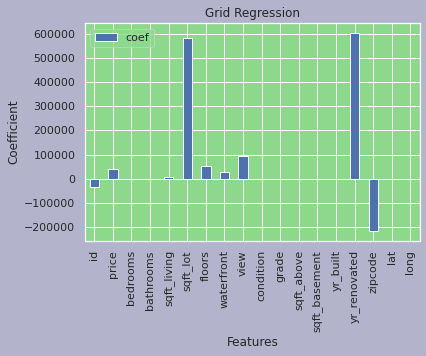

In [82]:
# Plot the coefficients of elastic Net regression
#
features = []
coef = []
for key, value in coef_dict_baseline.items():
    features.append(key)
    coef.append(value)

coef_dict = dict( coef = coef,
                 features = features)

lass_cf = pd.DataFrame.from_dict(coef_dict)
lass_cf

#Plot Features and Coeff

lass_cf.plot.bar(x = 'features' , y ='coef')


plt.title('Grid Regression')
plt.xlabel('Features', )
plt.ylabel('Coefficient')

> ***From the plot we can see the features with high coefficients and those with low/none.***

> ***The features with the highest coefficients are*** 

>> ***Square feet lot***

>> ***Year house was Renovated***

### 4) Lasso Regression

In [83]:
# Preview the top of the dataset
#
estate_df.head()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [84]:
# Get the data info
#
estate_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21610 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21610 non-null  int64  
 1   price          21610 non-null  float64
 2   bedrooms       21610 non-null  int64  
 3   bathrooms      21610 non-null  float64
 4   sqft_living    21610 non-null  int64  
 5   sqft_lot       21610 non-null  int64  
 6   floors         21610 non-null  float64
 7   waterfront     21610 non-null  int64  
 8   view           21610 non-null  int64  
 9   condition      21610 non-null  int64  
 10  grade          21610 non-null  int64  
 11  sqft_above     21610 non-null  int64  
 12  sqft_basement  21610 non-null  int64  
 13  yr_built       21610 non-null  int64  
 14  yr_renovated   21610 non-null  int64  
 15  zipcode        21610 non-null  int64  
 16  lat            21610 non-null  float64
 17  long           21610 non-null  float64
 18  sqft_l

In [0]:
# Splitting the data into features and labels
#
x = estate.iloc[:, 3:].values
y = estate['price'].values

In [0]:
# Standardize the features
#
sc = StandardScaler()
x = sc.fit_transform(x)

In [87]:
# Perform Linear Regression before splitting the data
#
linreg.fit(x, y)

print(f"Linear Score: {linreg.score(x,y)}")
print(f"Linear MSE: {mean_squared_error(y, linreg.predict(x))}")
print(f"Linear RMSE: {np.sqrt(mean_squared_error(y,linreg.predict(X)))}")
print("\n----------------------------------\n")
print(f"Linear coefficient:\n {linreg.coef_}")

Linear Score: 0.6998054429795937
Linear MSE: 40516476382.740685
Linear RMSE: 2918757153.0785246

----------------------------------

Linear coefficient:
 [-33268.05497234  31644.22657638  81859.88392556   5307.677983
   3658.08705333  50406.9369427   40633.99307283  17214.11571425
 112829.46638034  76348.83565818  27024.37810684 -77019.02126333
   8044.25575152 -31175.96803221  83545.84427149 -30243.04628266
  14868.25502167 -10440.01391467]


In [88]:
# Fit data to lasso model before splitting
#
from sklearn.linear_model import Lasso
lasso = Lasso(alpha=0.5)

lasso.fit(x,y)

print('lasso score:',lasso.score(X,y))
print('lasso MSE:',mean_squared_error(y_true=y, y_pred=lasso.predict(X)))
print('lasso RMSE:',np.sqrt(mean_squared_error(y_true=y, y_pred=lasso.predict(X))))
print("\n----------------------------------\n")
print('lasso coefficient:\n',lasso.coef_)

lasso score: -60685183.00680065
lasso MSE: 8.190521004105591e+18
lasso RMSE: 2861908629.5871835

----------------------------------

lasso coefficient:
 [-33267.46865451  31640.94487964 260646.27136482   5306.06161868
   3657.95812186  50406.56017888  40634.02888169  17213.56688432
 112830.77330126 -84845.33245725 -59125.00484445 -77018.07834815
   8043.88722163 -31174.70439746  83545.14459151 -30241.79009525
  14865.23856465 -10438.6194835 ]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 27072369909970.75, tolerance: 291664533601.623
  positive)


In [89]:
#Split to train and test and compare lasso and linear. 
# USe grid search to get the best value of alpha for lasso
#
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import warnings

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=30)

parameters = {'alpha':np.concatenate((np.arange(0.1,2,0.1), np.arange(2,5,0.5), np.arange(5, 25, 1)))}

gridlasso = GridSearchCV(lasso, parameters, scoring ='r2')

# Lasso
gridlasso.fit(x_train, y_train)
print('------------------- LASSO REGRESSION --------------------')
print(f"Lasso parameter: {gridlasso.best_params_}")
print(f"Lasso score: {gridlasso.score(x_test, y_test)}")
print(f"lasso MSE: {mean_squared_error(y_test, gridlasso.predict(x_test))}\n")

# Linear regression
linreg.fit(x_train, y_train)
print('------------------- LINEAR REGRESSION --------------------')
print(f"inear score: {linreg.score(x_test, y_test)}")
print(f"Linear MSE: {mean_squared_error(y_test, linreg.predict(x_test))}")
print(f"Linear coefficients: {linreg.coef_}")

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17433778912553.375, tolerance: 185974627366.88177
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17571912112978.0, tolerance: 190565743626.25616
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19055495983873.562, tolerance: 194114992462.94147
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18661770

------------------- LASSO REGRESSION --------------------
Lasso parameter: {'alpha': 0.1}
Lasso score: 0.7037758816410182
lasso MSE: 35234977196.51742

------------------- LINEAR REGRESSION --------------------
inear score: 0.7037758862988285
Linear MSE: 35234976642.48476
Linear coefficients: [-35241.91460191  32572.93024102  85469.89331018   6275.91675023
   2518.99329564  51494.18800348  39738.44518117  16387.21744188
 111329.49301787  80593.61213281  26573.69902655 -78748.4316358
   7922.22327912 -32824.55202923  83543.13075729 -31888.33877393
  12933.06306543 -11159.85439214]


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22761245039487.438, tolerance: 240244067921.1942
  positive)


In [90]:
# Preview the top of the dataset
#
estate_df.head(3)

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062


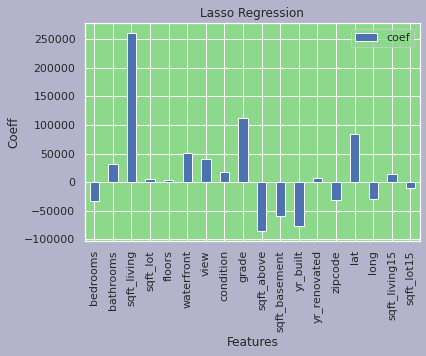

In [91]:
# coefficients and variables
coef_dict_baseline = {}

for coef, feat in zip(lasso.coef_.reshape(-1,1), estate_df.drop(['id','price'],1).columns):
    coef_dict_baseline[feat] = coef
    

features = []
coef = []
for key, value in coef_dict_baseline.items():
    features.append(key)
    coef.append(value)

coef_dict = dict( coef = coef,
                 features = features)


coef_var_df = pd.DataFrame(coef_dict)
coef_var_df['coef'] = coef_var_df['coef'].astype('float')

# plot variables and coef

import matplotlib.pyplot as plt

coef_var_df.plot.bar(x = 'features' , y ='coef')
plt.title('Lasso Regression')
plt.xlabel('Features',fontsize=12)
plt.ylabel("Coeff", fontsize=12)
plt.show()



> ***Observations***

### 5) **Elastic Net Regression**

In [92]:
# Import Elastic Net
#
from sklearn.linear_model import ElasticNet

# Splitting the data into features and labels
#
x = estate[['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',\
             'waterfront', 'view', 'condition', 'grade', 'sqft_above',\
             'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', \
             'lat', 'long','sqft_living15', 'sqft_lot15']]
y = estate['price']

# Linear Regression
linreg.fit(x,y)
first_model = (mean_squared_error(y_true=y, y_pred=linreg.predict(x)))
print(f"First Model MSE: {first_model}")

First Model MSE: 40516476382.74068


In [93]:
# Below are the coefficients of this first model. We use a for loop to go through 
# the model and the zip function to combine the two columns.
# 
coef_dict_baseline = {}
for coef, feat in zip(linreg.coef_,x.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

{'bathrooms': 41086.4796859555,
 'bedrooms': -35768.71065539721,
 'condition': 26452.779794803195,
 'floors': 6774.473560477717,
 'grade': 95986.43787142597,
 'lat': 602919.8978106941,
 'long': -214749.27038033196,
 'sqft_above': 70.81873963681448,
 'sqft_basement': 39.68342449533284,
 'sqft_living': 110.50216402350496,
 'sqft_living15': 21.69250043824536,
 'sqft_lot': 0.12813586026156376,
 'sqft_lot15': -0.3823432947501715,
 'view': 53038.76708908075,
 'waterfront': 582596.6679528151,
 'yr_built': -2622.19559179319,
 'yr_renovated': 20.036006529944864,
 'zipcode': -582.6833384628599}

In [0]:
# Elastic Net Model
# 
# ------
#
elastic=ElasticNet(normalize=True)
search=GridSearchCV(estimator=elastic,param_grid={'alpha':np.logspace(-5,2,8),'l1_ratio':[.2,.4,.6,.8]},scoring='neg_mean_squared_error',n_jobs=1,refit=True,cv=10)


In [95]:
# We will now fit our model and display the best parameters
# and the best results we can get with that setup.
# 
search.fit(x,y)
search.best_params_
abs(search.best_score_)

41056391892.6791

In [96]:
# For clarity, we will set our hyperparameters to the recommended values and run on the data.
# 
# 
elastic=ElasticNet(normalize=True,alpha=0.001,l1_ratio=0.75)
elastic.fit(X,y)
second_model=(mean_squared_error(y_true=y,y_pred=elastic.predict(X)))
print(second_model)

79379796353.87564


In [97]:
# Below are the coefficients
# 
coef_dict_baseline = {}
for coef, feat in zip(elastic.coef_,x.columns):
    coef_dict_baseline[feat] = coef
coef_dict_baseline

# The coefficients are mostly the same. 
# Notice that occupation was completely removed from the model in the elastic net version. 
# This means that this values was no good to the algorithm. Traditional regression cannot do this.

{'bathrooms': 23092.41353015308,
 'bedrooms': 9156.641284308314,
 'condition': 5774.469576990948,
 'floors': 14348.63369280961,
 'grade': 22213.295768656822,
 'lat': 117986.43759762798,
 'long': -19351.33870008512,
 'sqft_above': 26.884865952777446,
 'sqft_basement': 29.91604069935898,
 'sqft_living': 28.801676611430295,
 'sqft_living15': 31.197750633817456,
 'sqft_lot': 0.05888041348916262,
 'sqft_lot15': 0.0632990517930481,
 'view': 21960.681600457112,
 'waterfront': 143892.94044017338,
 'yr_built': -116.57070982636239,
 'yr_renovated': 14.787227066423618,
 'zipcode': -5.7606474972601704}

Text(0, 0.5, 'Coefficient')

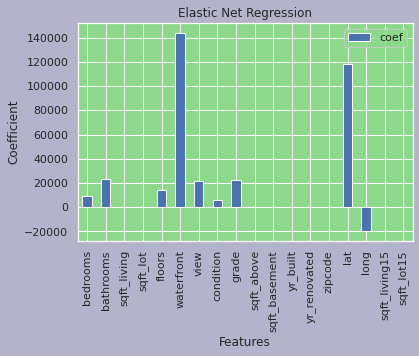

In [98]:
# Plot the coefficients of elastic Net regression
#
features = []
coef = []
for key, value in coef_dict_baseline.items():
    features.append(key)
    coef.append(value)

coef_dict = dict( coef = coef,
                 features = features)

lass_cf = pd.DataFrame.from_dict(coef_dict)
lass_cf

#Plot Features and Coeff

lass_cf.plot.bar(x = 'features' , y ='coef')
plt.title('Elastic Net Regression')
plt.xlabel('Features', )
plt.ylabel('Coefficient')